# Computer Vision 2023 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly.

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>.

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
!pwd
%cd drive/MyDrive/Colab\ Notebooks
!pwd

In [1]:
# Numpy is the main package for scientific computing with Python.
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)

    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography()
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epipolar lines
        img2 - image where the points are defined for visualizing epilines in image 1
        pts1, pts2 are your good matches in image 1 and 2.
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test". Ratio test was used in SIFT to find good matches and was described in the lecture. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [18]:
# load images as grey scale
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

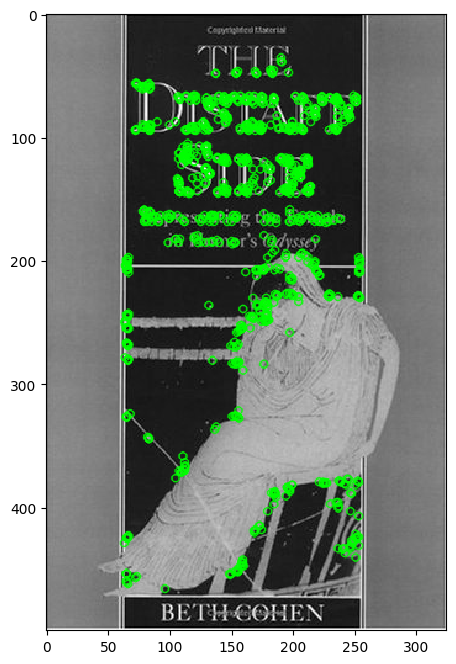

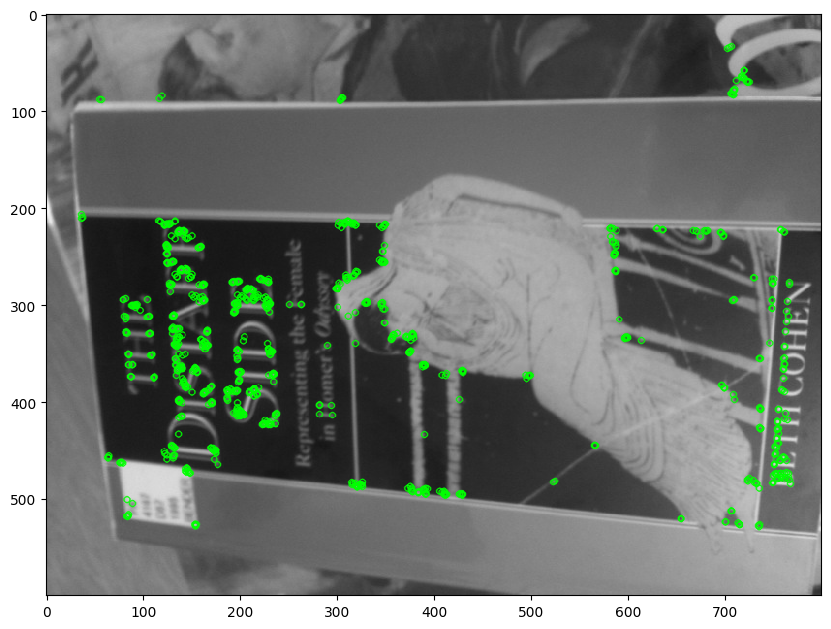

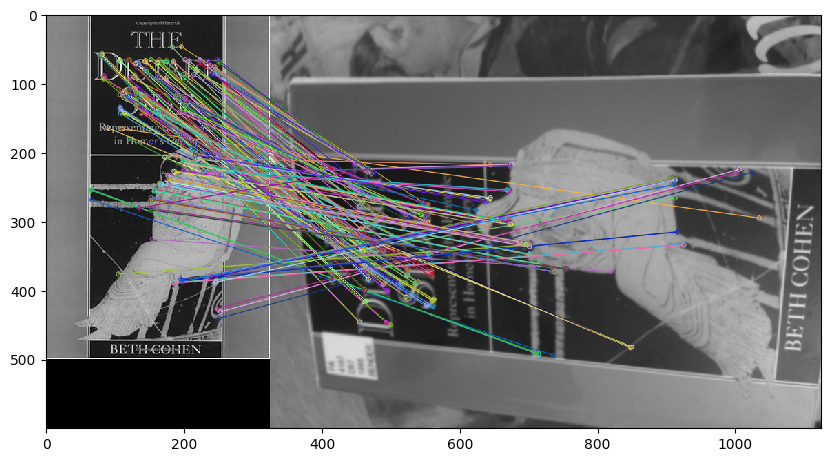

Number of good matches:  221


In [19]:
# Your code for descriptor matching tests here

# compute detector and descriptor, see (2) above
orb = cv2.ORB_create(nfeatures=1000) # create ORB detector
kp_1 = orb.detect(img1, None) # detect keypoints in img1
kp_2 = orb.detect(img2, None) # detect keypoints in img2

# find the keypoints and descriptors with ORB, see (2) above
kp_1, des_1 = orb.compute(img1, kp_1) # compute descriptors for img1
kp_2, des_2 = orb.compute(img2, kp_2) # compute descriptors for img2

# draw keypoints, see (2) above
kp1_draw = cv2.drawKeypoints(img1, kp_1, img1, color=(0,255,0), flags=0)
kp2_draw = cv2.drawKeypoints(img2, kp_2, img2, color=(0,255,0), flags=0)
plt.imshow(kp1_draw), plt.show()
plt.imshow(kp2_draw), plt.show()

# create BFMatcher object, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING) # create BFMatcher object

# Match descriptors, see (3) above
matches = bf.knnMatch(des_1, des_2, k=2) # find knn matches

# Apply ratio test, see (3) above
good = []
ratio = 0.8
for m,n in matches:
    if m.distance < ratio * n.distance:
        good.append(m) # append good matches to list


# draw matches, see (4) above
img_matches = cv2.drawMatches(img1, kp_1, img2, kp_2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_matches), plt.show()

# count good matches
print('Number of good matches: ', len(good))

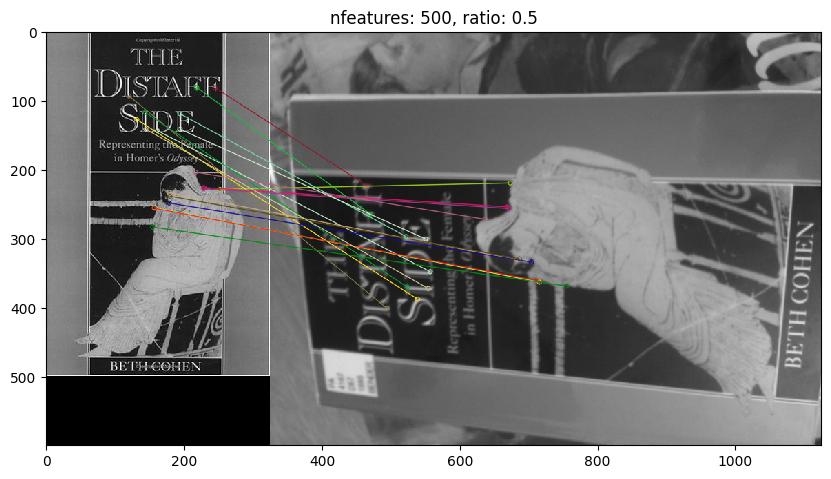

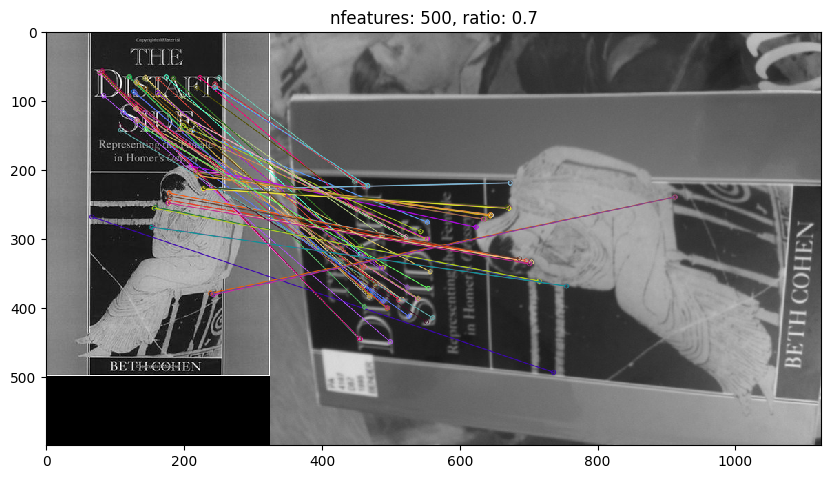

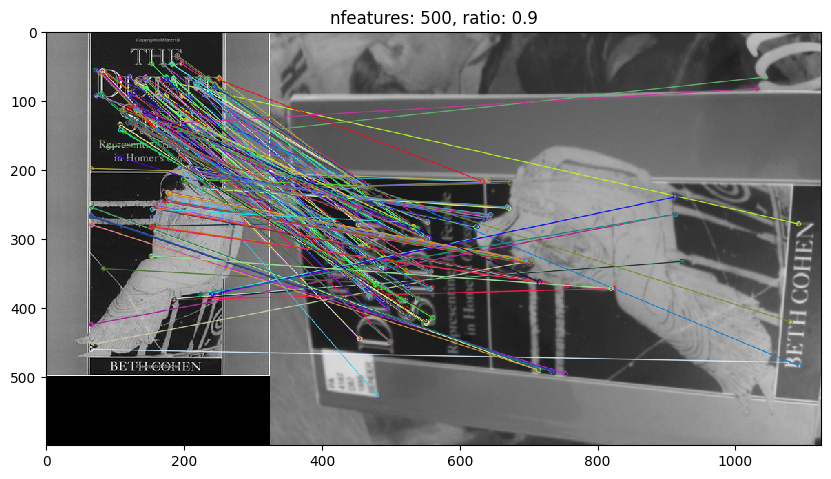

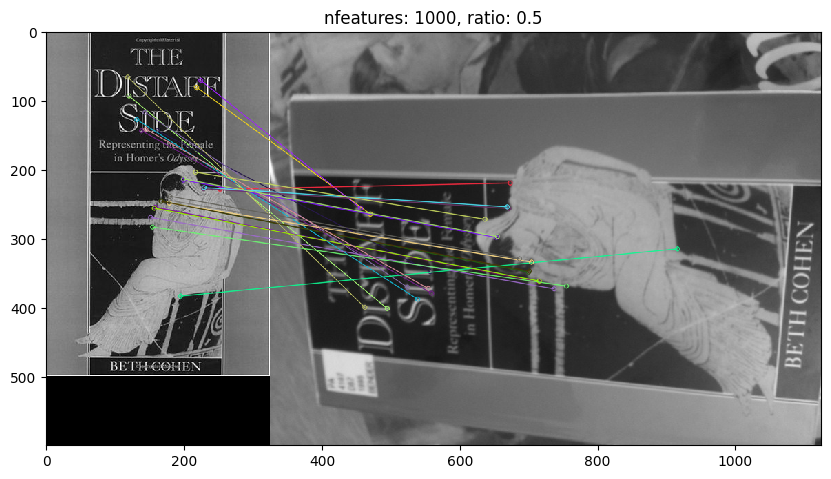

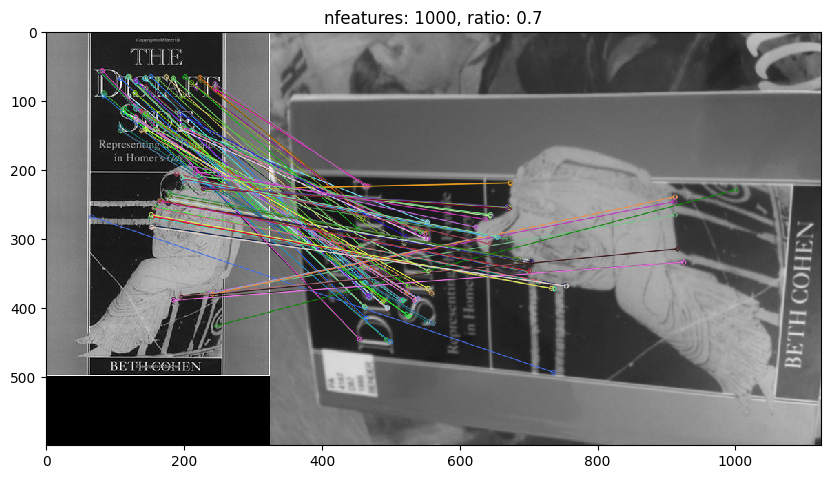

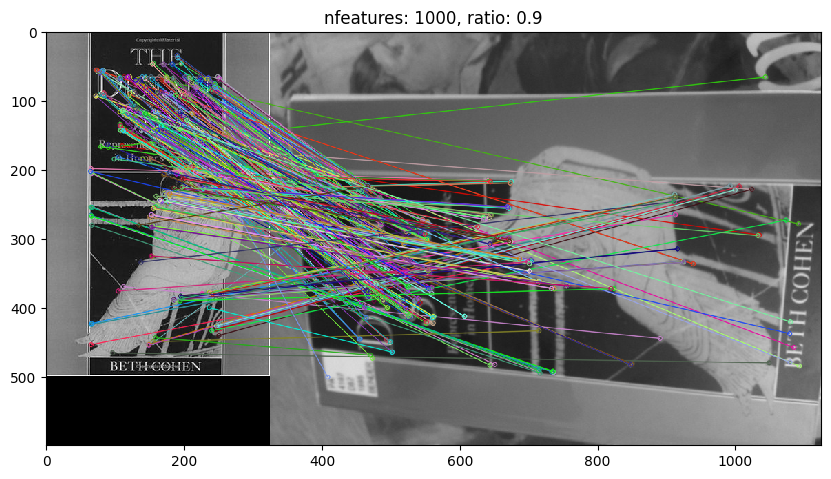

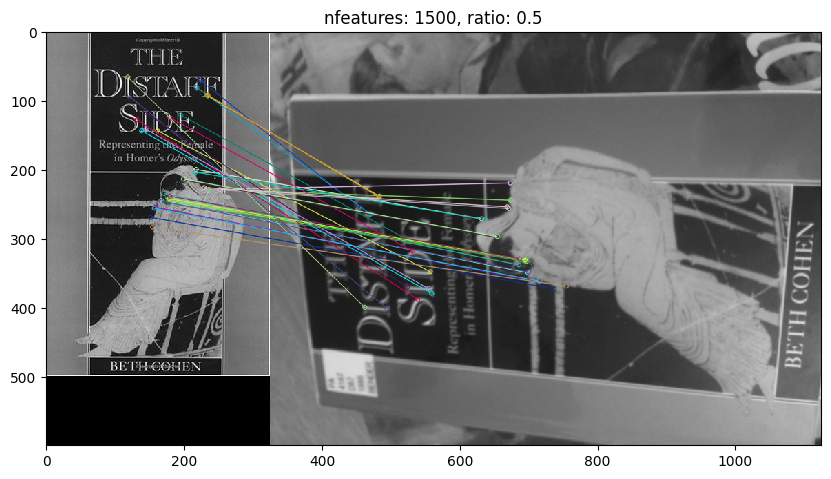

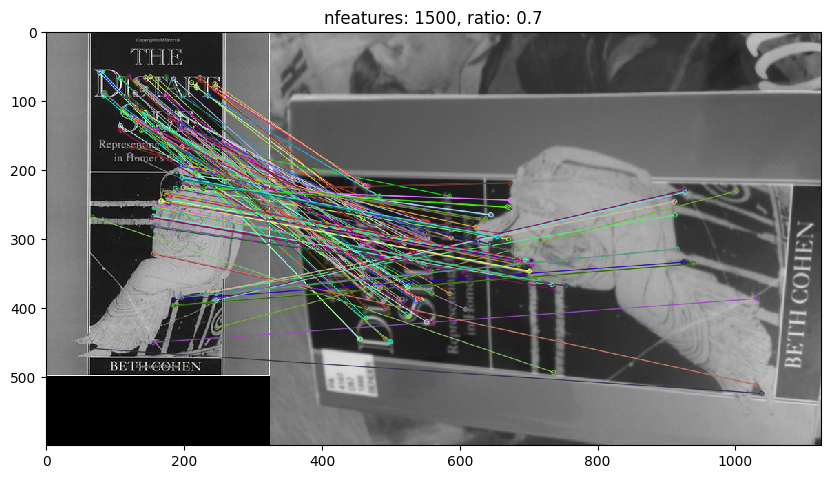

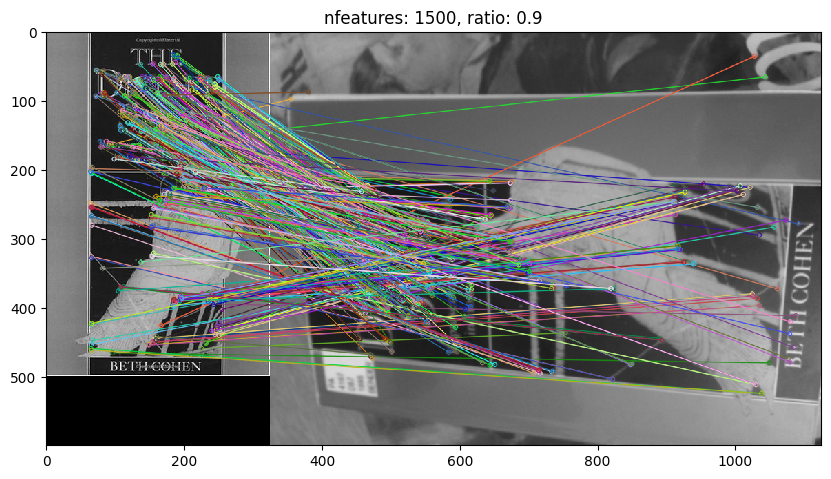

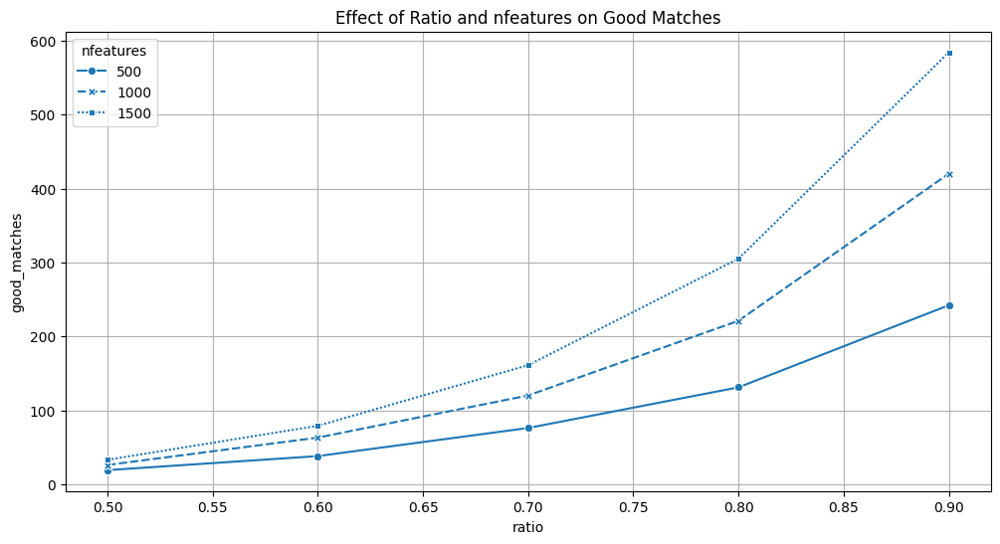

In [ ]:
import pandas as pd
import seaborn as sns

# experiment with different values
nfeatures = [500, 1000, 1500]
ratios = [0.5, 0.6, 0.7, 0.8, 0.9]
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)

test_results = []
# experiment with different values enumerate
for nfeature in nfeatures:
    orb = cv2.ORB_create(nfeatures=nfeature) # create ORB detector
    kp_1 = orb.detect(img1, None) # detect keypoints in img1
    kp_2 = orb.detect(img2, None) # detect keypoints in img2

    # find the keypoints and descriptors with ORB, see (2) above
    kp_1, des_1 = orb.compute(img1, kp_1) # compute descriptors for img1
    kp_2, des_2 = orb.compute(img2, kp_2) # compute descriptors for img2

    # create BFMatcher object, see (3) above
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)

    # Match descriptors, see (3) above
    matches = bf.knnMatch(des_1, des_2, k=2) # find knn matches

    # Apply ratio test, see (3) above
    for ratio in ratios:
        good = []
        for m,n in matches:
            if m.distance < ratio * n.distance:
                good.append(m)

        # save results
        test_results.append({
            'nfeatures': nfeature,
            'ratio': ratio,
            'good_matches': len(good)
        })
        
        # draw matches for 0.5 0.7 0.9
        if ratio in [0.5, 0.7, 0.9]:
            img_matches = cv2.drawMatches(img1, kp_1, img2, kp_2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(img_matches), plt.title(f"nfeatures: {nfeature}, ratio: {ratio}"), plt.show()
            
        

df = pd.DataFrame(test_results)
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='ratio', y='good_matches', style='nfeatures', markers=True)
plt.title("Effect of Ratio and nfeatures on Good Matches")
plt.grid(True)

***Your explanation of what you have done, and your results, here***
#### Step 1-4 discussion
Feature Detection and Description
- Images were loaded in grayscale, and ORB was used to detect keypoints and compute binary descriptors.
- Keypoints were visualized with cv2.drawKeypoints() to confirm good spatial coverage.

Descriptor Matching and Ratio Test
- Matching was performed using cv2.BFMatcher with Hamming distance, suitable for ORB descriptors.
- KNN matching (k=2) was followed by Lowe’s ratio test (default 0.8) to filter ambiguous matches.
- Good matches were visualized using cv2.drawMatches() to verify correct alignment.

Parameter Experiments
- I varied nfeatures (500, 1000, 1500) and ratio thresholds (0.5–0.9) to evaluate match performance.
- Results were recorded and visualized using Seaborn line plots for comparison.

Findings:
- Higher nfeatures led to more keypoints and matches.
- Lower ratios (e.g., 0.5) produced fewer but more accurate matches.
- Ratios of 0.7–0.8 offered a good balance of match count and reliability.

Interpretation and Future Work
- Match accuracy was assessed visually through manual inspection of drawn matches, focusing on alignment and consistency.
- While match count is useful, it does not guarantee correctness.




5. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

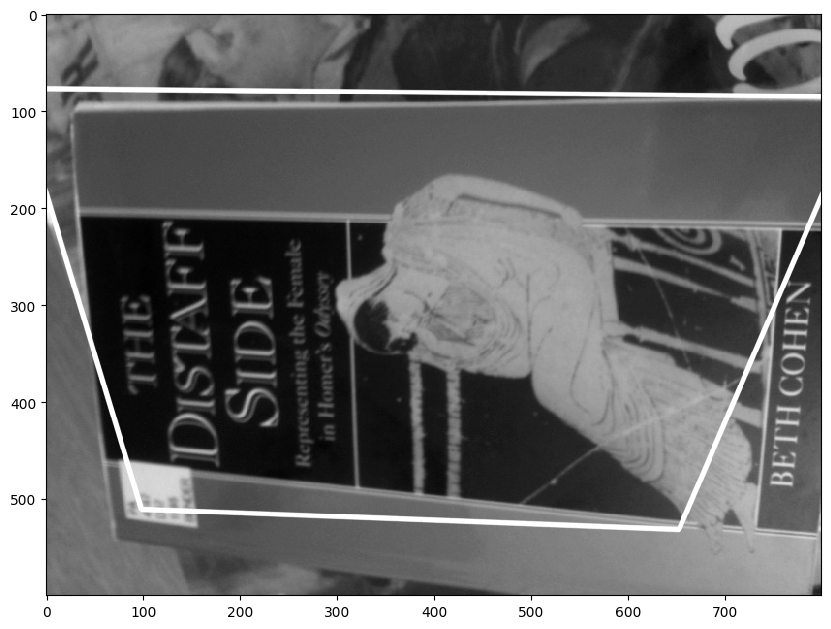

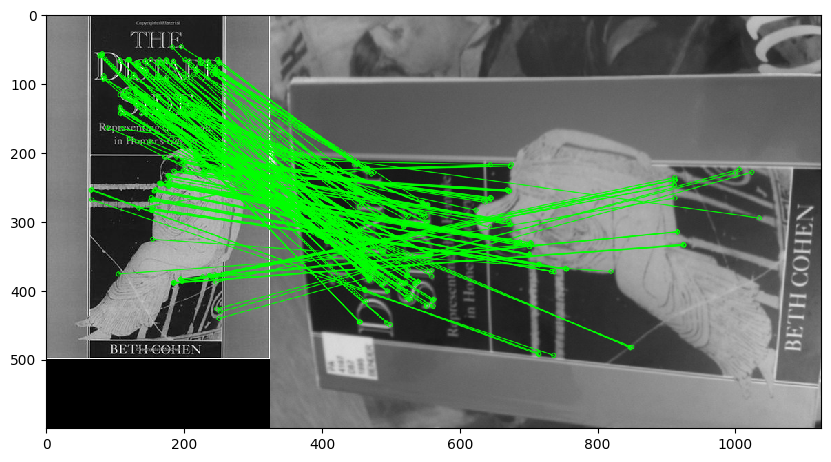

In [65]:
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)

orb = cv2.ORB_create(nfeatures=1000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2)

good = []
ratio = 0.8
for m,n in matches:
    if m.distance < ratio * n.distance:
        good.append(m) # append good matches to list

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using cv2 standard method, see (3) above
H, mask = cv2.findHomography(src_pts, dst_pts, method=0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

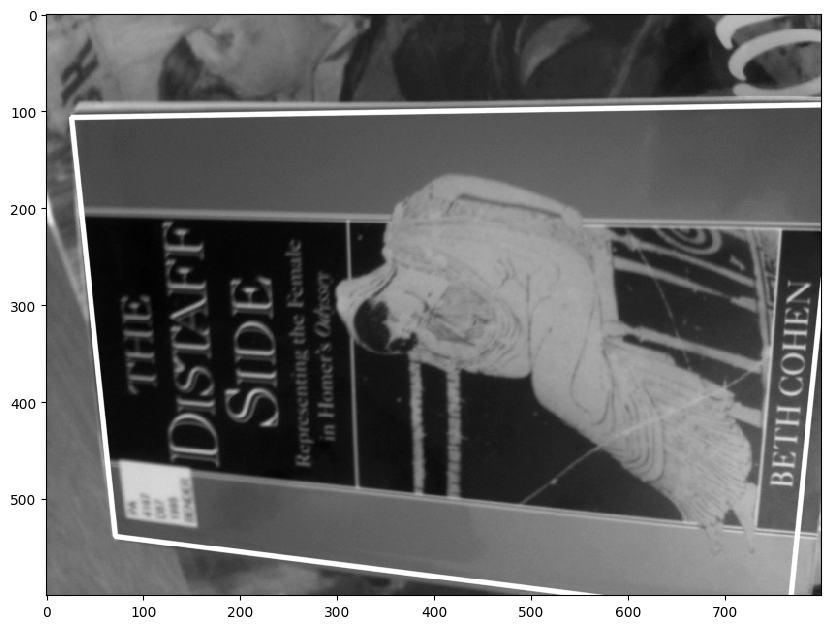

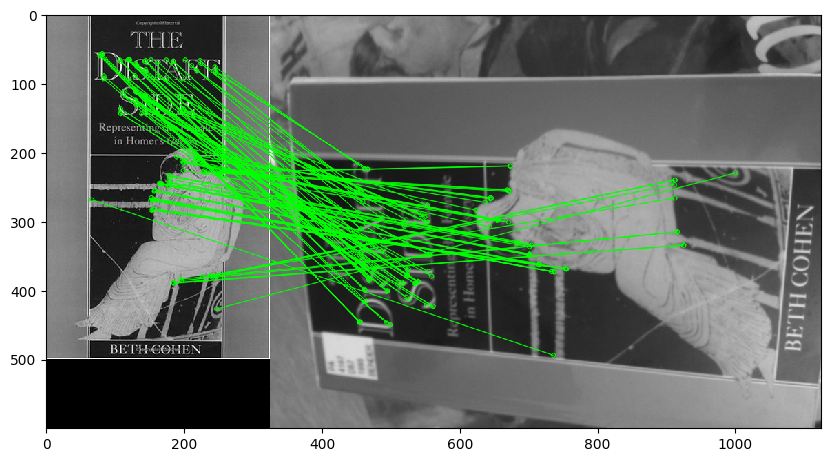

In [62]:
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)

orb = cv2.ORB_create(nfeatures=1000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2)

good = []
ratio = 0.7
for m,n in matches:
    if m.distance < ratio * n.distance:
        good.append(m) # append good matches to list

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using cv2 standard method, see (3) above
H, mask = cv2.findHomography(src_pts, dst_pts, method=0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)




***Your explanation of results here***
#### Step 5.1 discussion
- Homography Estimation: Used cv2.findHomography() with method=0 (least squares) to estimate the transformation between the reference and query images.

- Ratio Threshold Test
    - At ratio = 0.8, the number of ambiguous matches was higher, leading to a less reliable homography. The outline was distorted and did not tightly fit the book.
    - Lowering the threshold to 0.7 eliminated many poor matches, resulting in a cleaner set of correspondences that successfully enabled homography computation.

- Outline Projection: Using draw_outline(), the reference image was projected onto the query image. With ratio = 0.7, the projected corners accurately matched the true edges of the book.

- Inlier Visualization: Inlier matches consistent with the estimated homography were visualized using cv2.drawMatches() via draw_inliers(). These confirmed spatial consistency between keypoints.

- Visual Interpretation: Even with least square method, the transformation at ratio = 0.7 appeared visually accurate. In contrast, ratio = 0.8 produced a distorted projection in the example.

Conclusion
- This highlights the sensitivity of homography to the quality of matched features. Stricter ratio filtering (e.g., 0.7) helped remove false matches and improve the reliability of the transformation.



Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

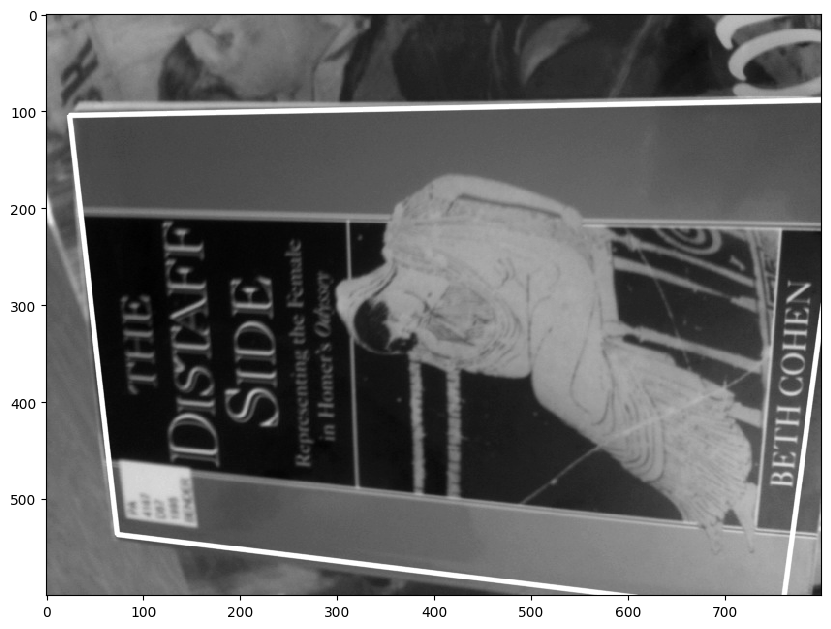

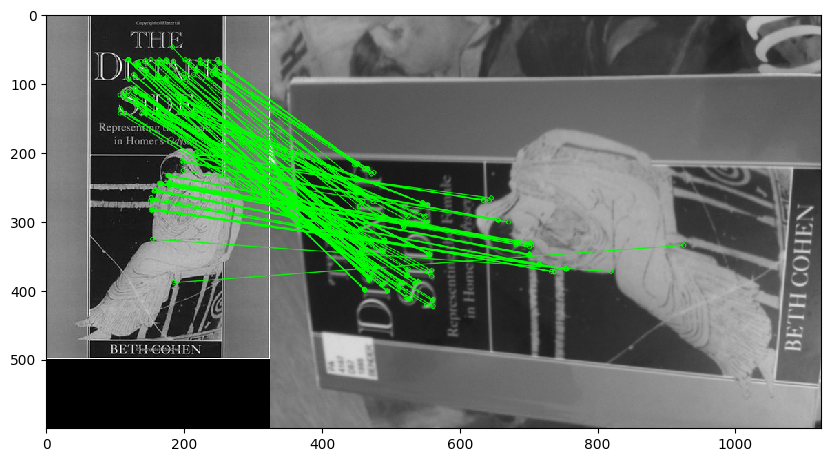

Number of inliers:  147
----Experiment with different thresholds----
Number of inliers for threshold 1:  45
Outline for threshold  1


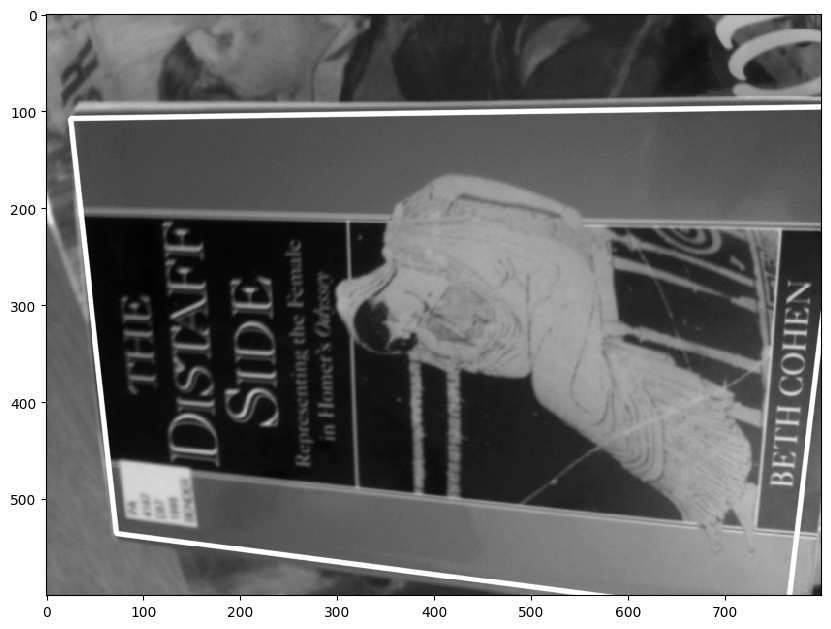

Number of inliers for threshold 3:  141
Outline for threshold  3


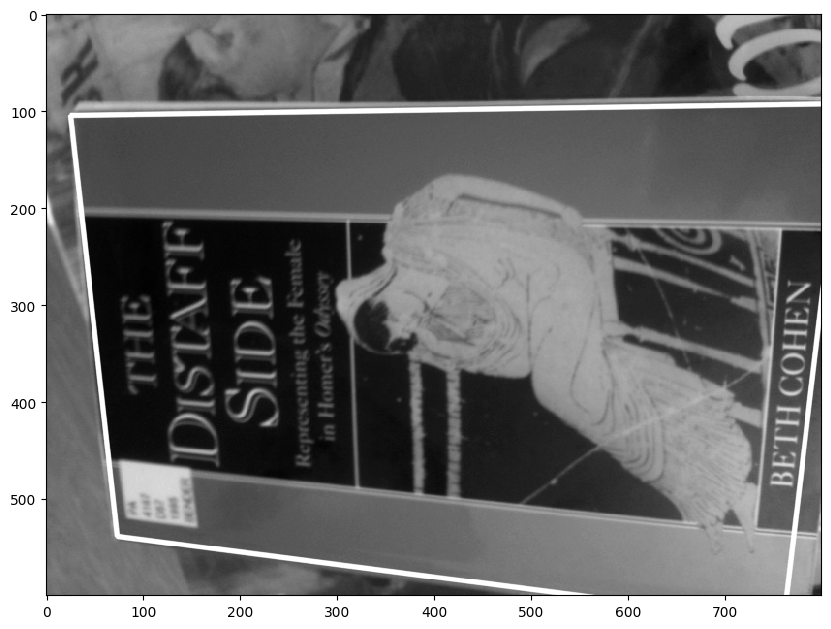

Number of inliers for threshold 5:  147
Outline for threshold  5


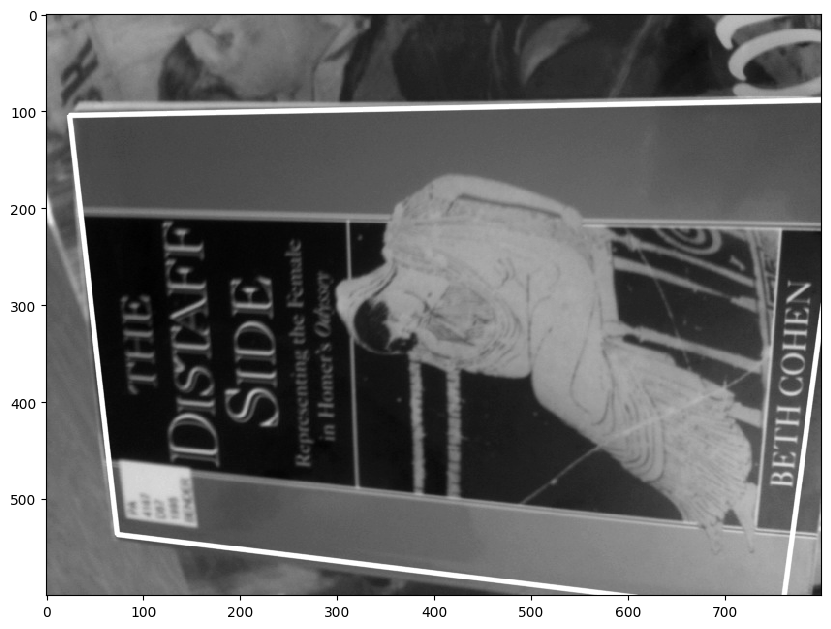

Number of inliers for threshold 7:  174
Outline for threshold  7


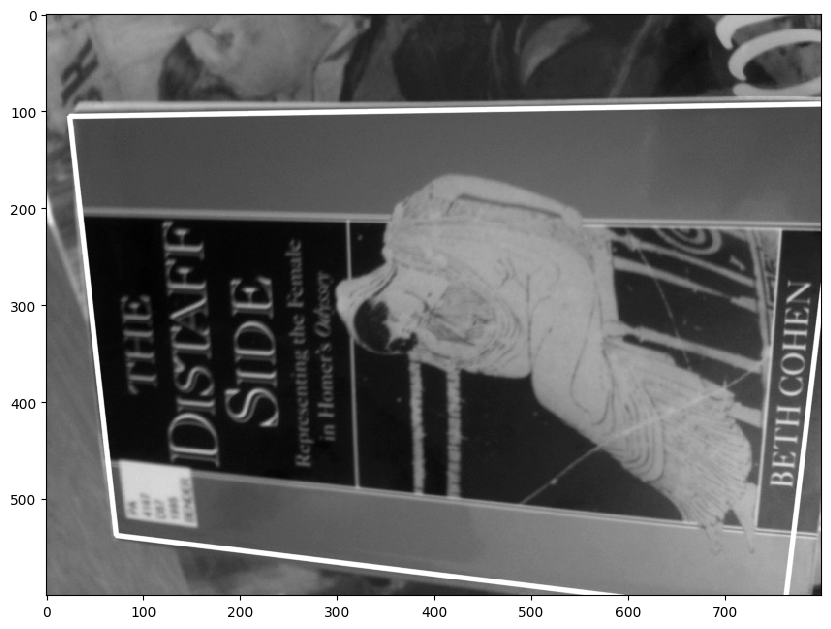

Number of inliers for threshold 9:  185
Outline for threshold  9


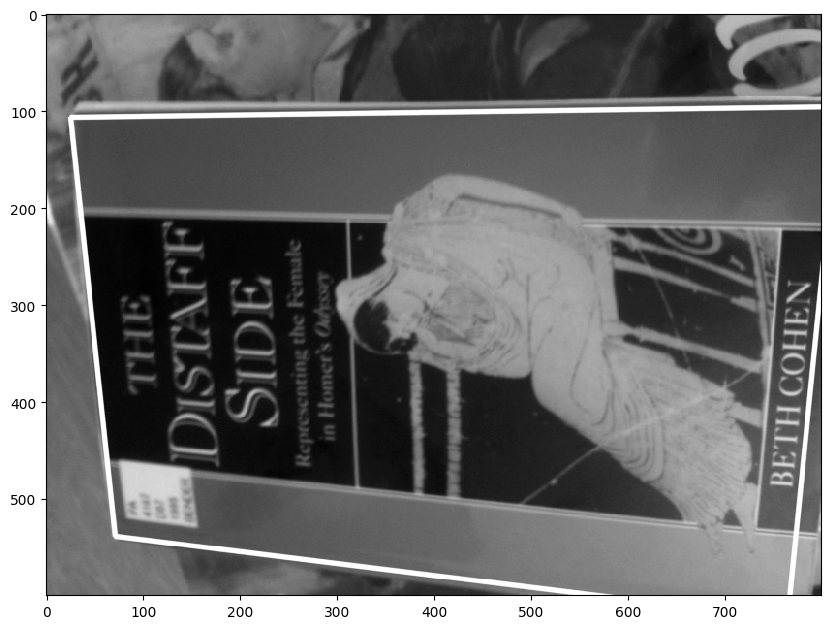

Number of inliers for threshold 11:  188
Outline for threshold  11


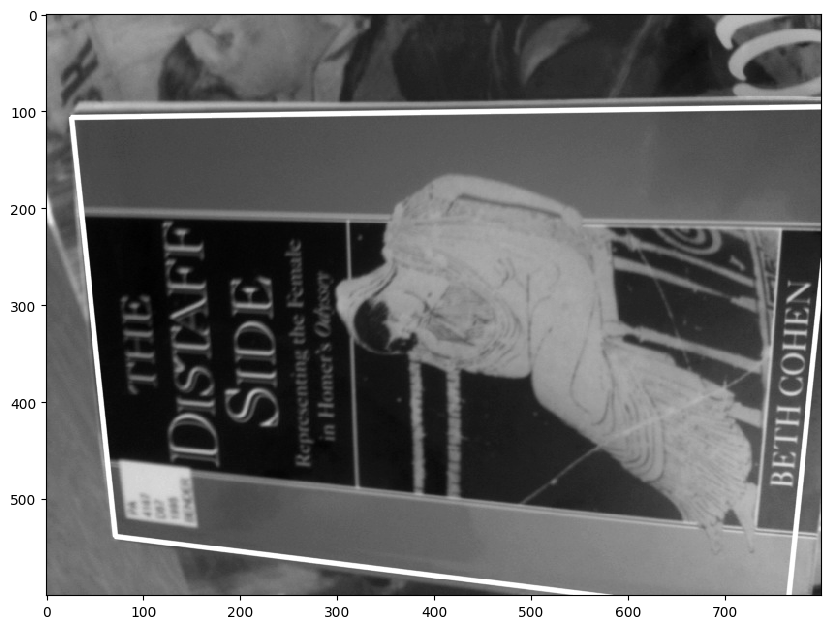

Number of inliers for threshold 13:  191
Outline for threshold  13


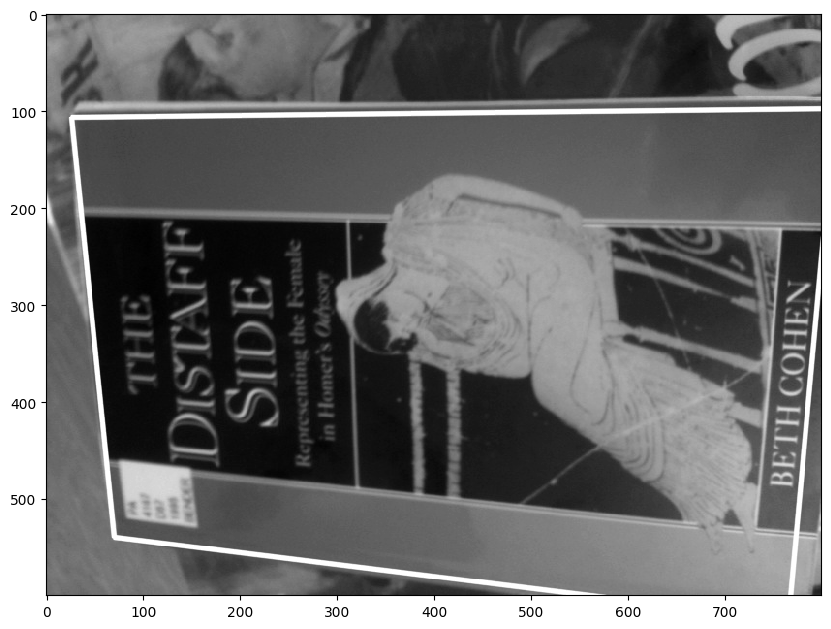

Number of inliers for threshold 15:  194
Outline for threshold  15


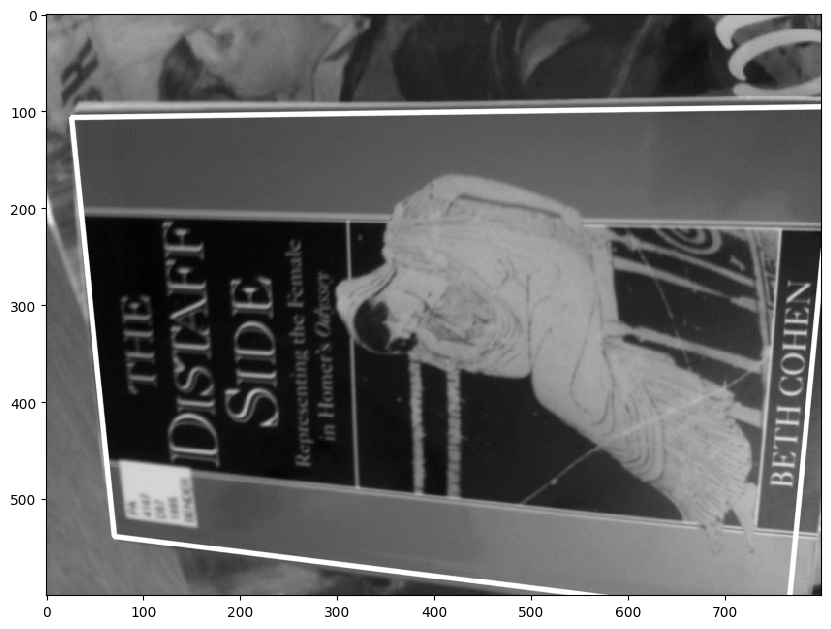

Number of inliers for threshold 17:  198
Outline for threshold  17


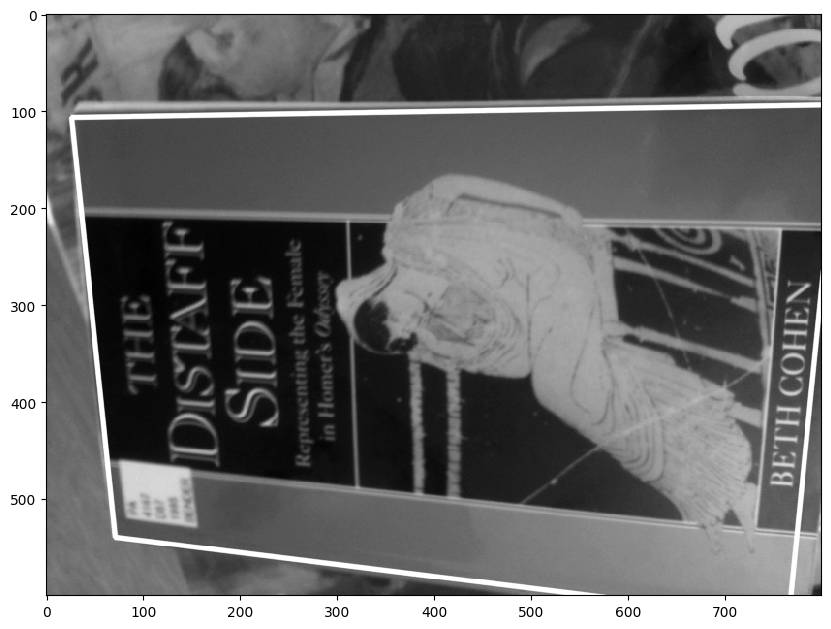

Number of inliers for threshold 19:  199
Outline for threshold  19


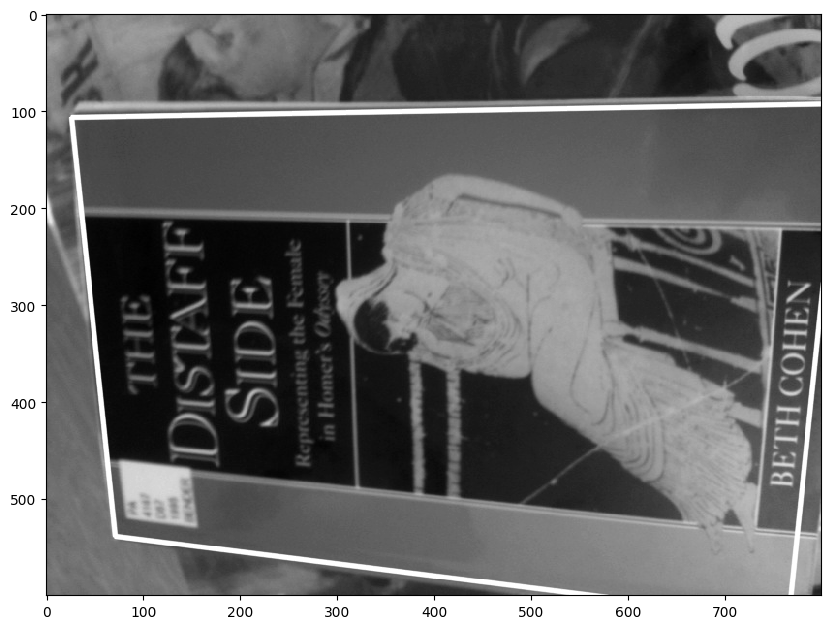

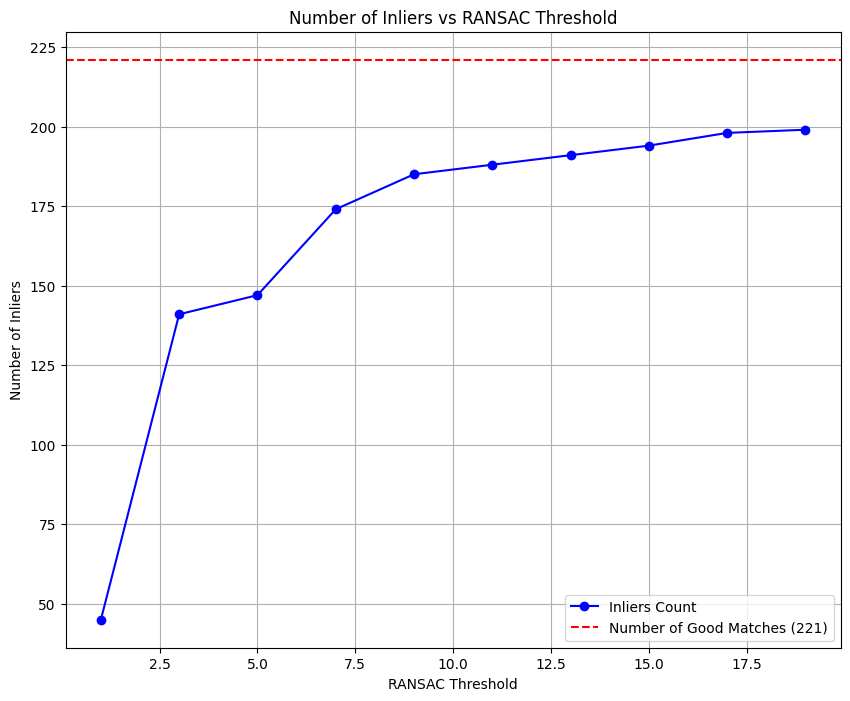

In [102]:
# Your code to display book location after RANSAC here
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)

orb = cv2.ORB_create(nfeatures=1000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2)

good = []
ratio = 0.8
for m,n in matches:
    if m.distance < ratio * n.distance:
        good.append(m) # append good matches to list

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
H, mask = cv2.findHomography(src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=5.0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

# inlier number
inliers = mask.ravel().tolist()
print('Number of inliers: ', sum(inliers))

print("----Experiment with different thresholds----")

# experiment with different thresholds
inliers_number_list = []
for threshold in range(1, 21, 2):
    H_i, mask_i = cv2.findHomography(src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=threshold)
    inliers = mask_i.ravel().tolist()
    inliers_ratio = sum(inliers) / len(good)
    inliers_number_list.append(sum(inliers))
    # plot the outline
    print(f'Number of inliers for threshold {threshold}: ', sum(inliers))
    print("Outline for threshold ", threshold)
    draw_outline(img1, img2, H_i)

# plot the inliers number
plt.plot(range(1, 21, 2), inliers_number_list, 'bo-', label='Inliers Count')
plt.axhline(y=len(good), color='r', linestyle='--', label=f'Number of Good Matches ({len(good)})')

plt.xlabel('RANSAC Threshold')
plt.ylabel('Number of Inliers')
plt.title('Number of Inliers vs RANSAC Threshold')
plt.grid(True)
plt.legend()
plt.show()


***Your explanation of what you have tried, and results here***
#### Step 5.2 discussion

Key Observation:
- Despite varying the RANSAC reprojection threshold from 1 to 19, homography estimation was successful at every threshold tested.
- The projected outline of the reference book consistently aligned well with its actual location in the query image.
- This confirms the robustness of RANSAC-based homography estimation in this setup.

Interpretation:
- At lower thresholds (e.g., 1–3), RANSAC is stricter, accepting only very precise matches. This leads to a smaller number of inliers, but these are typically of higher geometric accuracy.
- As the threshold increases, RANSAC becomes more tolerant of error, allowing more matches to be considered inliers — this explains the rising curve.
- However, the rate of increase slows down as the threshold continues to grow. This behavior forms an elbow-shaped curve, where the number of inliers initially increases rapidly, then plateaus.
- This plateau suggests that beyond a certain point, increasing the threshold adds diminishing returns — most valid matches are already included, and further increases mainly risk admitting poor or noisy correspondences.
- Interestingly, even at higher thresholds (e.g., 15–19), the transformation still remained geometrically stable, likely due to a strong set of dominant correspondences that anchor the homography.



6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

***Your explanation of results here***

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images.

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hint 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.-->


In [9]:
# Your code to iddntify query objects and measure search accuracy for data set here



***Your explanation of what you have done, and your results, here***

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [10]:
# Your code to run extra queries and display results here

***Your explanation of results and any changes made here***

---




6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [11]:
# Your code to search images and display results here

***Your description of what you have done, and explanation of results, here***

## Question 3: FUndametal Matrix, Epilines and Retrival (optional, assesed for granting up to 25% bonus marks for the A2)

In this question, the aim is to accuractely estimate the fundamental matrix given two views of a scene, visualise the corresponding epipolar lines and use the inlier count of fundametal matrix for retrival.

The steps are as follows:

1. Select two images of the same scene (query and reference) from the landmark dataset and find the matches as you have done in Question 1 (1.1-1.4).
2. Compute fundametal metrix with good matches (after appying ratio test) using the opencv function cv.findFundamentalMat(). Use both 8 point algorithm and RANSAC assisted 8 point algorithm to compute fundamental matrix.
 1. Hint: You need minimum 8 matches to be able to use the function. Ignore pairs where 8 mathes are not found.
3. Visualise the epipolar lines for the matched features and analyse the results. You can use openCV function cv.computeCorrespondEpilines() to estimate the epilines. We have provided the code for drawing these epilines in function drawlines() that you can modify as required.


In [12]:
# Your code to find fundamental matrices with and without RANSAC goes here

In [13]:
# Your code to visualise the epipolar lines for both cases for an example goes here

***Your visualization for epilines goes here***

---

4. Repeat the steps for some examples from the landmarks datasets.

In [14]:
 # Your code for additional images goes here

***Your visualization for additional epillines goes here***

---

5. Find a query from landmarks data for which the retrival in Q2 failed. Attempt the retrival with replacing the Homography + RANSAC method of Q2 to Fundamental Matrix + RANSAC method using code written above.
Does the change of the model makes retraival successful? Analyse and comment.

In [15]:
# Your code for retrival goes here

***Your analysis goes here***

---
